# Fun with Filters and Frequencies!

## CS194-26 Project 2, Spring 2020

### by Sukrit Arora 

#### sukrit.arora@berkeley.edu -- cs194-ahb

In [1]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import skimage as sk
import skimage.io as skio
import skimage.transform as sktr
import scipy as sp
from scipy import signal,ndimage
import cv2
import math

import warnings
warnings.simplefilter('ignore')

In [31]:
from IPython.display import HTML
HTML('''<script>
code_show_err=true; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
<!--To toggle on/off output_stderr, click <a href="javascript:code_toggle_err()">here</a>.-->''')


In [32]:
from IPython.core.display import HTML
HTML("""
<style>

div.cell { /* Tunes the space between cells */
margin-top:1em;
margin-bottom:1em;
}

div.text_cell_render h1 { /* Main titles bigger, centered */
font-size: 2.2em;
line-height:0.9em;
}

div.text_cell_render h2 { /*  Parts names nearer from text */
margin-bottom: -0.4em;
}


div.text_cell_render { /* Customize text cells */
font-family: 'Georgia';
font-size:1.2em;
line-height:1.4em;
padding-left:3em;
padding-right:3em;
}

.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}

</style>

<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>

<!--<a href="javascript:code_toggle()">toggle code</a>-->.

""")

## Part 1.1 - Finite Difference Operator

For this question, I took the partial derivative of the cameraman image with respect to the x-axis and the y-axis. Using these two resulting derivative images, I created a gradient magnitude image by taking the norm of the stacked images i.e. $\sqrt{\left(\frac{\partial i}{\partial x}\right)^2+\left(\frac{\partial i}{\partial y}\right)^2}$. Then, I took the resulting gradient magnitude image and binarized it by thresholding. I used some scalar multiple of the mean of the gradient magnitude image, which was found through trial and error.

In [4]:
# Helper functions

def conv(im, filt):
    return signal.convolve2d(im, filt, mode="same")

def threshold(im, thresh):
    im[im<thresh] = 0
    im[im>=thresh] = im.max()
    return im
    

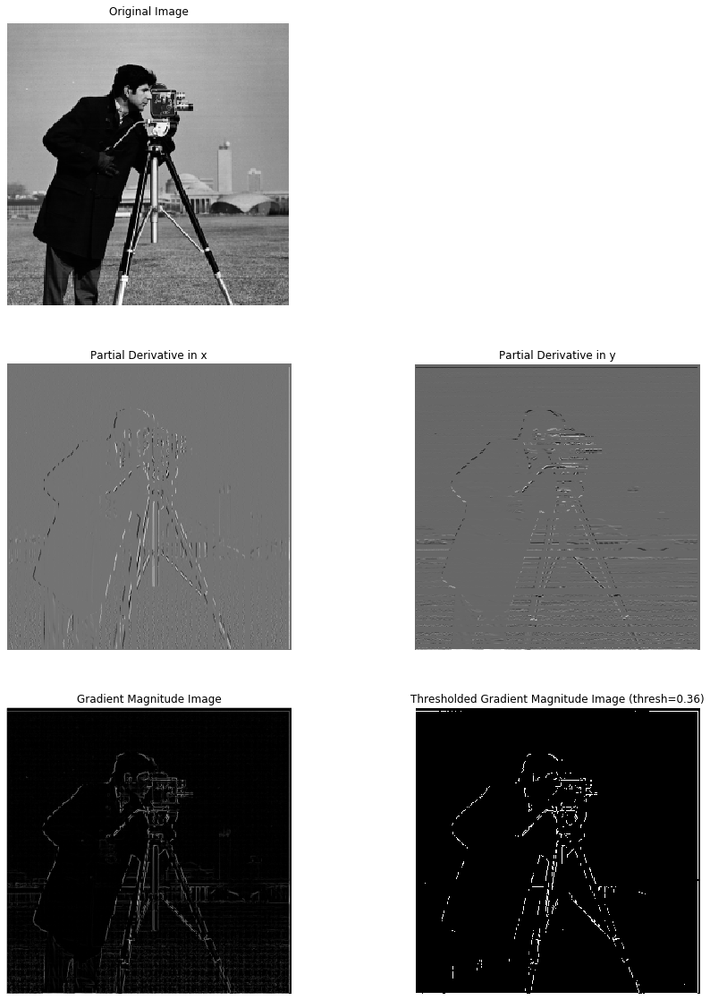

In [5]:
im_caman = plt.imread("data/cameraman.png")[...,0]

dx = np.array([[1, -1]])
dy = np.array([[1], [-1]])
gx = conv(im_caman, dx)
gy = conv(im_caman, dy)
gm = np.linalg.norm(np.stack((gx,gy)), axis=0)
thresh = gm.mean()*10
gm_thresh = threshold(gm.copy(), thresh)

plt.figure(figsize=(15,20))
plt.subplot(321)
plt.axis('off')
plt.title("Original Image")
plt.imshow(im_caman, cmap="gray")

plt.subplot(323)
plt.axis('off')
plt.title("Partial Derivative in x")
plt.imshow(gx, cmap="gray")

plt.subplot(324)
plt.axis('off')
plt.title("Partial Derivative in y")
plt.imshow(gy, cmap="gray")

plt.subplot(325)
plt.axis('off')
plt.title("Gradient Magnitude Image")
plt.imshow(gm, cmap="gray")

plt.subplot(326)
plt.axis('off')
plt.title("Thresholded Gradient Magnitude Image (thresh={:.2f})".format(thresh))
plt.imshow(gm_thresh, cmap="gray")

plt.show()

# Saving
# plt.imsave("out/caman_gx.jpg", gx, cmap="gray")
# plt.imsave("out/caman_gy.jpg", gy, cmap="gray")
# plt.imsave("out/caman_gm.jpg", gm, cmap="gray")
# plt.imsave("out/caman_gm_thresh.jpg", gm_thresh, cmap="gray")

## Part 1.2 - Derivative of Gaussian (DoG) Filter

In order to combat the noisy results from the previous part, I used a gaussian filter to blur the image before taking the derivatives. I created a 2D gaussian filter by taking the outer product of two 1D filter with $\text{size}=5$ and $\sigma=2$.

We see that the result here is a lot less noisy, and that the edges are more continuous and pronounced. However, we also see thicker edges, which is fine in this case but is a downside of this technique.

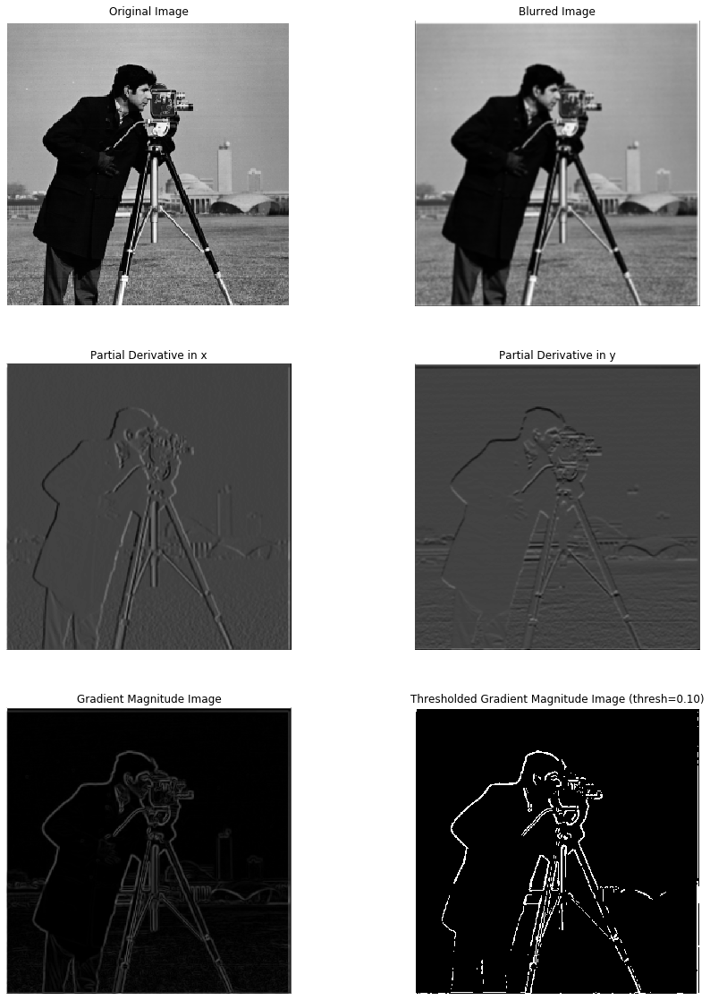

In [6]:
# Blur image, then take derivative

gauss_1d = cv2.getGaussianKernel(5, 2)
gauss = np.outer(gauss_1d,gauss_1d)
caman_blur = conv(im_caman, gauss)

gx = conv(caman_blur, dx)
gy = conv(caman_blur, dy)
gm = np.linalg.norm(np.stack((gx,gy)), axis=0)
thresh = gm.mean()*5
gm_thresh = threshold(gm.copy(), thresh)

plt.figure(figsize=(15,20))
plt.subplot(321)
plt.axis('off')
plt.title("Original Image")
plt.imshow(im_caman, cmap="gray")

plt.subplot(322)
plt.axis('off')
plt.title("Blurred Image")
plt.imshow(caman_blur, cmap="gray")

plt.subplot(323)
plt.axis('off')
plt.title("Partial Derivative in x")
plt.imshow(gx, cmap="gray")

plt.subplot(324)
plt.axis('off')
plt.title("Partial Derivative in y")
plt.imshow(gy, cmap="gray")

plt.subplot(325)
plt.axis('off')
plt.title("Gradient Magnitude Image")
plt.imshow(gm, cmap="gray")

plt.subplot(326)
plt.axis('off')
plt.title("Thresholded Gradient Magnitude Image (thresh={:.2f})".format(thresh))
plt.imshow(gm_thresh, cmap="gray")

plt.show()

I repeated the denoising technique below, but rather than blur the image first, I created a Derivative of Gaussian (DoG) filter (by convolving my derivative filter with my gaussian). This way, I can use the DoG filter directly on the original image.

As we see below, the thresholded results are the same either way. This is due to the fact that the order of convolutions does not matter as it is a linear operator.

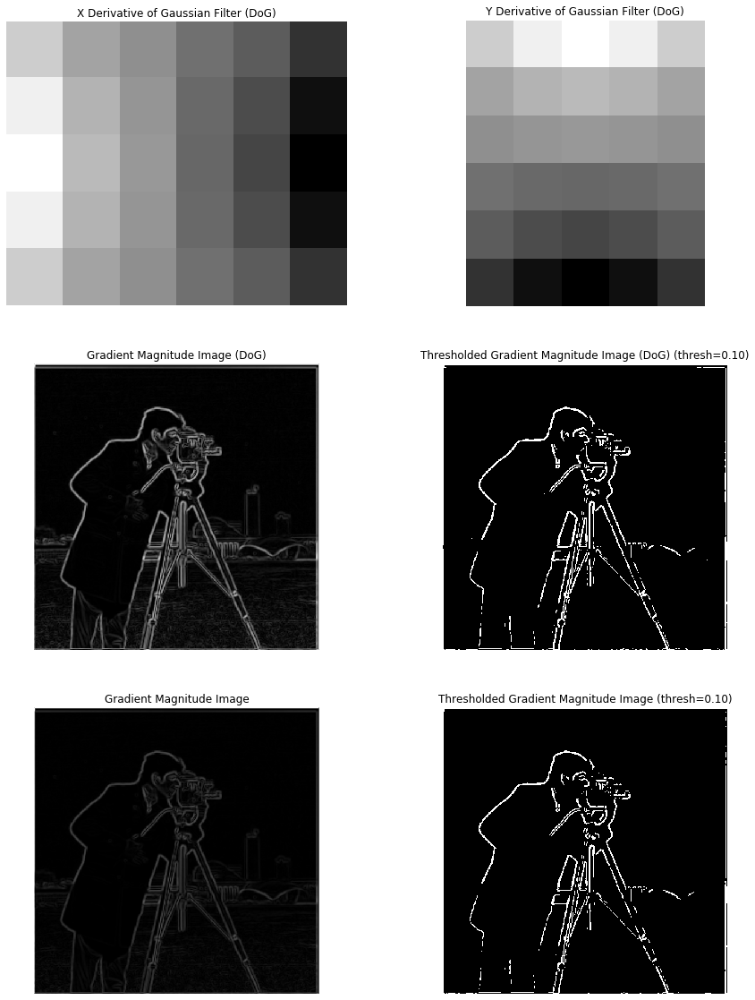

In [7]:
# DoG filter

gauss_1d = cv2.getGaussianKernel(5, 2)
gauss = np.outer(gauss_1d,gauss_1d)
dx_g = signal.convolve2d(dx, gauss)
dy_g = signal.convolve2d(dy, gauss)

gx_dog = conv(im_caman, dx_g)
gy_dog = conv(im_caman, dy_g)
gm_dog = np.linalg.norm(np.stack((gx_dog,gy_dog)), axis=0)
thresh = gm_dog.mean()*5
gm_dog_thresh = threshold(gm_dog.copy(), thresh)

plt.figure(figsize=(15,20))

plt.subplot(321)
plt.axis('off')
plt.title("X Derivative of Gaussian Filter (DoG)")
plt.imshow(dx_g, cmap="gray")

plt.subplot(322)
plt.axis('off')
plt.title("Y Derivative of Gaussian Filter (DoG)")
plt.imshow(dy_g, cmap="gray")

plt.subplot(323)
plt.axis('off')
plt.title("Gradient Magnitude Image (DoG)")
plt.imshow(gm_dog, cmap="gray")

plt.subplot(324)
plt.axis('off')
plt.title("Thresholded Gradient Magnitude Image (DoG) (thresh={:.2f})".format(thresh))
plt.imshow(gm_dog_thresh, cmap="gray")

plt.subplot(325)
plt.axis('off')
plt.title("Gradient Magnitude Image")
plt.imshow(gm, cmap="gray")

plt.subplot(326)
plt.axis('off')
plt.title("Thresholded Gradient Magnitude Image (thresh={:.2f})".format(thresh))
plt.imshow(gm_thresh, cmap="gray")

plt.show()

# Saving
# plt.imsave("out/caman_gx_DoG.jpg", gx_dog, cmap="gray")
# plt.imsave("out/caman_gy_DoG.jpg", gy_dog, cmap="gray")
# plt.imsave("out/caman_gm_DoG.jpg", gm_dog, cmap="gray")
# plt.imsave("out/caman_gm_thresh_DoG.jpg", gm_dog_thresh, cmap="gray")

## Part 1.3 - Image Straightening

In order to straighten an image, we take advantage of the fact that statistically there is a preference for vertical and horizontal edges in most images. So, in order to straighten an image, I first generate a set of rotations to search over. For each rotation angle, I compute the gradient angle of the edges in the image. This is done by finding the partial derivative images (with the DoG filter to minimize noise) and using $\verb|atan2|$ on these images to obtain an gradient angle image. I then flatten the gradient angle image and count the number of number of straight horizontal and vertical angles. I save this count for each rotation angle, and choose the rotation angle that resulted in the maximal count.

After some parameter tuning, I chose the set of rotation angles as $\theta \in \{-10,-9,\cdots,9,10\}$. I encountered some issues in my initial implementation of the algorithm. This was remedied by tuning the parameters of the Gaussian used in the DoG filter and by cropping the image to look just at the center $70%$ of the image.

Below are the results of applying this method to several images, and the resulting histogram of the distribution of gradient angles in each image. This method works well in most cases, but as we can see below, fails for an image like the rolling hills. This is because the straight image has many curves at different angles, which is not the kind of input we were expecting in this method.

In [8]:
# Helper functions

gauss_1d = cv2.getGaussianKernel(9, 2)
gauss = np.outer(gauss_1d,gauss_1d)
dx_g = signal.convolve2d(dx, gauss)
dy_g = signal.convolve2d(dy, gauss)

def get_dx(im):
    return signal.convolve2d(im,dx_g, mode="same")

def get_dy(im):
    return signal.convolve2d(im, dy_g, mode="same")

def clean(im):
    im = im + np.abs(test.min())
    return threshold(im, im.mean()*0.8)

def get_grad_ang(im):
    return (np.arctan2(get_dy(im),get_dx(im))*180/np.pi).flatten().astype(int)

def crop(im, perc):
    h,w = im.shape
    # c1,c2 = tuple([dim//2 for dim in im.shape])
    # h_bounds = slice(int(np.round(c1-(h*perc//2))),int(np.round(c1+int(h*perc//2))))
    # w_bounds = slice(int(np.round(c2-int(w*perc//2))),int(np.round(c2+int(w*perc//2))))
    h_bounds = slice(int((1-perc)*h),-int((1-perc)*h))
    w_bounds = slice(int((1-perc)*w),-int((1-perc)*w))
    return im[h_bounds,w_bounds]


In [9]:
def get_opt_rot(im):
    rot_angles = np.linspace(-10, 10, 21)
    im_grey = np.mean(im, axis=-1).astype(np.uint8)
    
    og_thetas = get_grad_ang(crop(im_grey, 0.7))
    
    counts = {}

    for r in rot_angles:
        counts[r] = 0
        rot_im = ndimage.interpolation.rotate(im_grey, r)
        cropped_im = crop(rot_im, 0.7)
        thetas = get_grad_ang(cropped_im)
        counts[r] = thetas[(thetas==0)|(thetas==90)|(thetas==-90)].size
    
    r_star = max(counts, key=counts.get)
    return r_star, thetas, og_thetas

In [10]:
fnames = ["data/facade.jpg", "data/crooked.jpg", "data/crooked_2.jpg", "data/sp1.jpg", "data/hills.jpeg"]
results = []
ims = []
for fname in fnames:
    im = plt.imread(fname)
    ims.append(im)
    results.append(get_opt_rot(im))

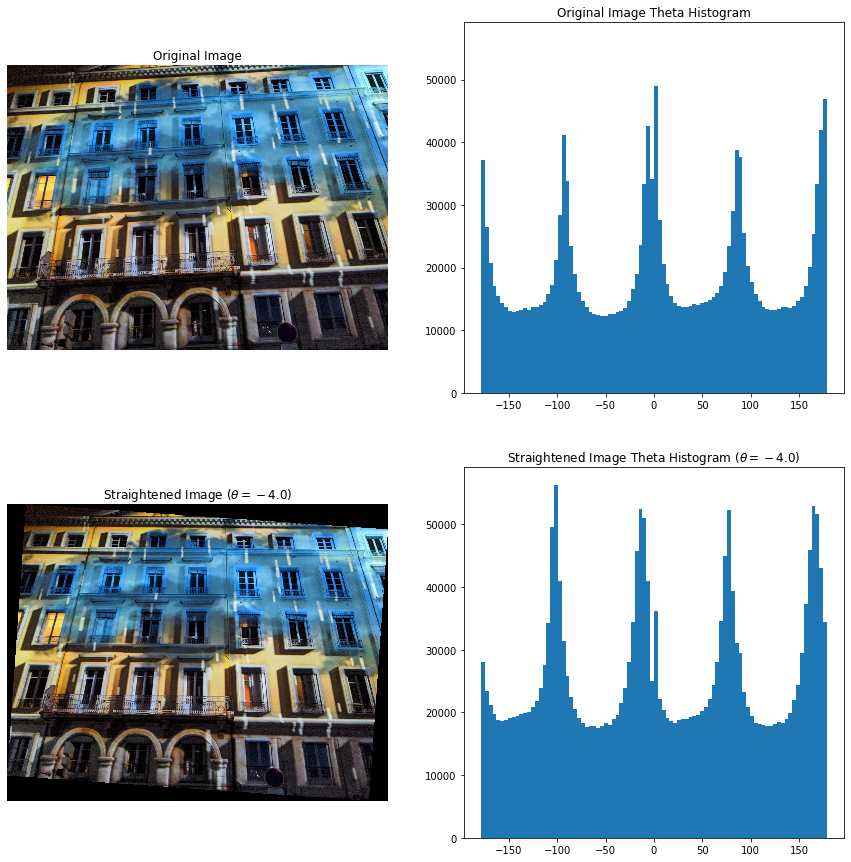

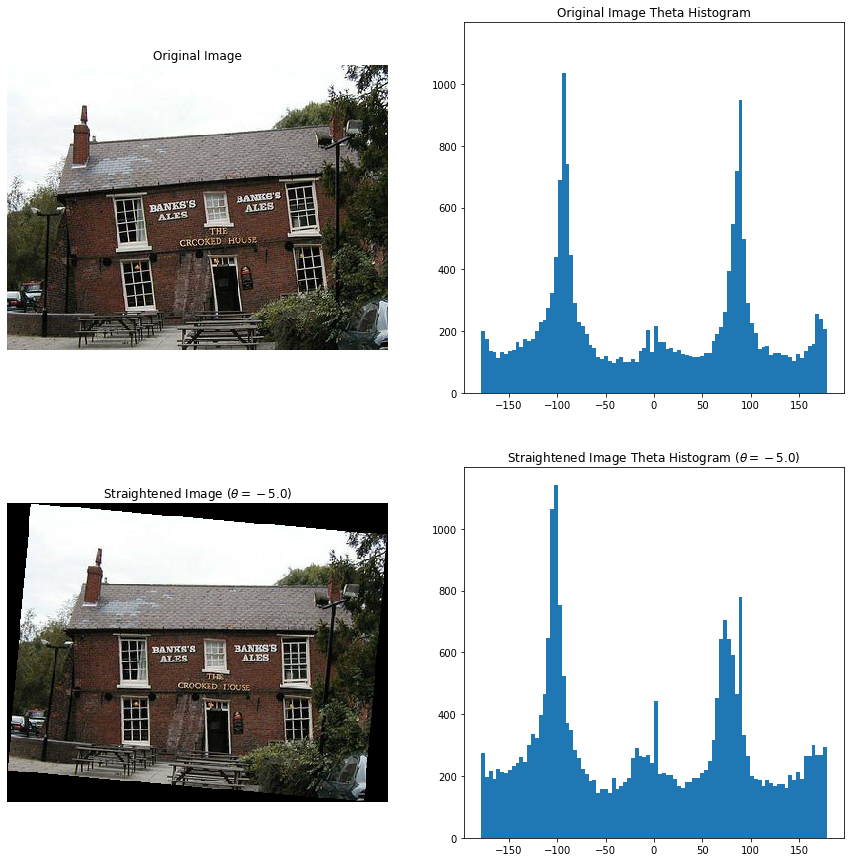

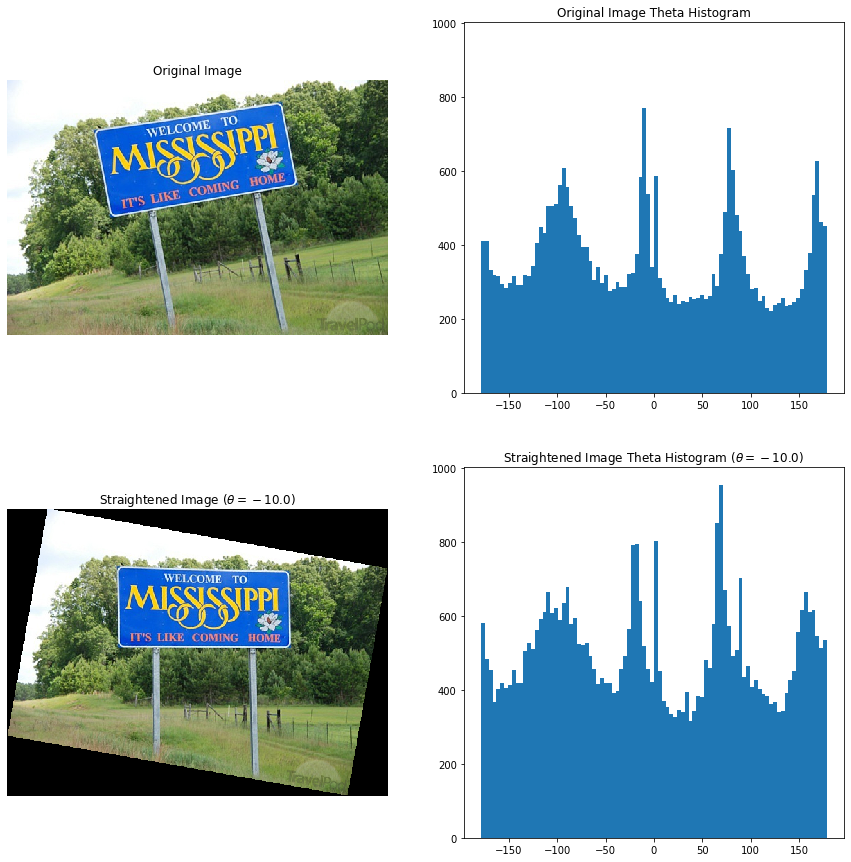

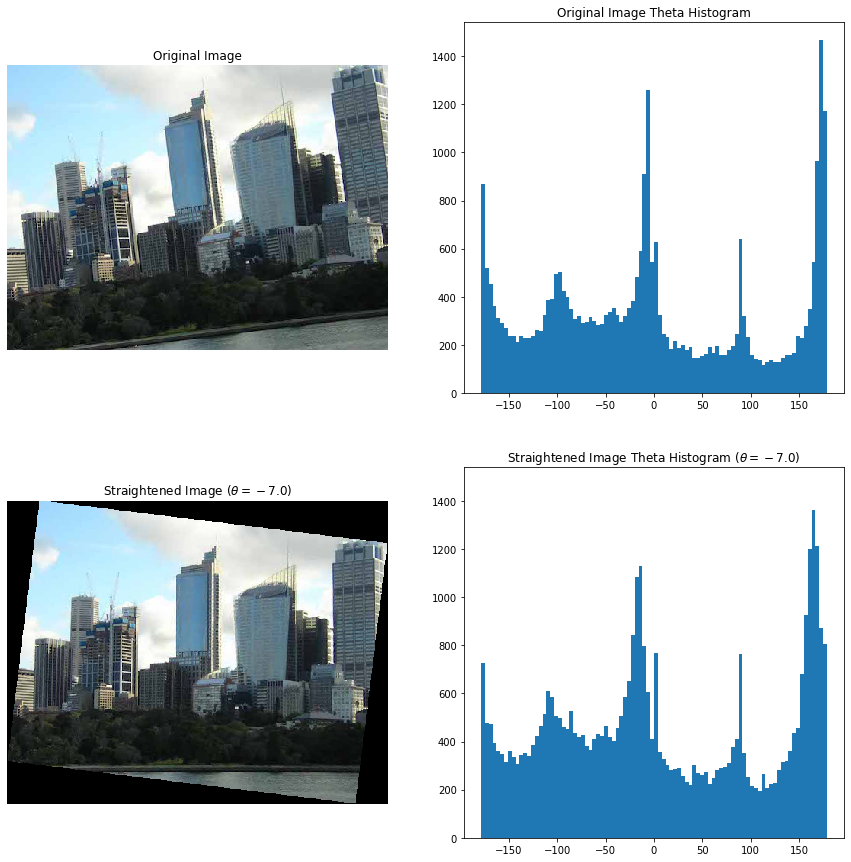

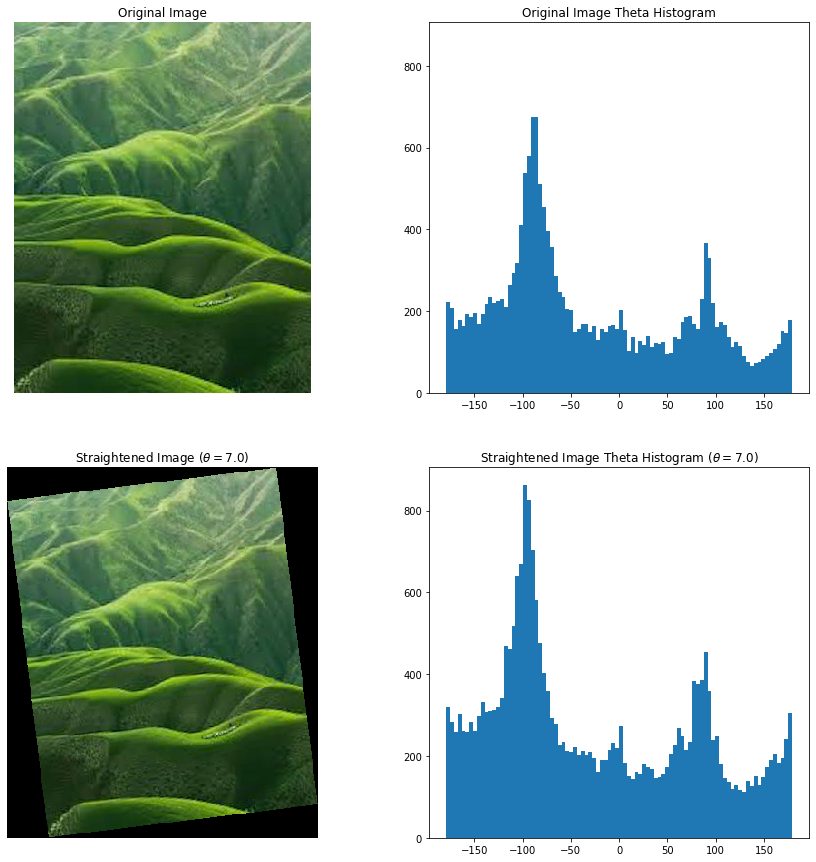

In [11]:
for i in range(len(fnames)):
    r_star, thetas, og_thetas = results[i]
    
    plt.figure(figsize=(15,15))

    plt.subplot(221)
    plt.axis('off')
    plt.title("Original Image")
    plt.imshow(ims[i])

    ax = plt.subplot(222)
    plt.title("Original Image Theta Histogram")
    plt.hist(og_thetas, bins=90)
    
    straight_im = ndimage.interpolation.rotate(ims[i], r_star)

    plt.subplot(223)
    plt.axis('off')
    plt.title(r'Straightened Image ($\theta={}$)'.format(r_star))
    plt.imshow(straight_im) 

    plt.subplot(224, sharey=ax)
    plt.title(r'Straightened Image Theta Histogram ($\theta={}$)'.format(r_star))
    plt.hist(thetas, bins=90)
    
    # Saving
#     fname = fnames[i]
#     new_name = "out" + fname[fname.index("/"):fname.index(".")] + "_straight.jpg"
#     plt.imsave(new_name, straight_im)

## Part 2.1 - Image "Sharpening"

In this question I perform image sharpening by using the unsharp masking technique. The idea behind this technique is that images look sharper if their high frequencies are more prominent. So, we take the Gaussian filter that we have been using to blur the image and then subtract it from the original image. This results in a high frequency "detail" image. We then add a scaled version of this detail to the original image, boosting the high frequencies of that image and thereby making it look sharper.

We can also create a single unsharp mask filter, that performs all of these operations in a single convolution. The derivation of this filter follows:

$$f +\alpha\cdot(f - f*g)=(1+\alpha)f - \alpha\cdot f * g = f *((1+\alpha)\delta-\alpha g)$$

where $f$ is the image to sharpen, $g$ is a Gaussian filter, $\delta$ is a 2D unit impulse, and $\alpha$ is a scalar parameter.

The results below show each step of the process, and the sharpened image done both ways (which result in the same sharp image).

In [12]:
# Sharpening step by step
def sharpen(im, kern=9, std=4, alpha=0.8):
    gauss_1d = cv2.getGaussianKernel(kern, std)
    gauss = np.outer(gauss_1d,gauss_1d)
    im_blur = np.dstack([conv(im[...,i], gauss) for i in range(3)])
    detail = im-im_blur
    sharpened = im+alpha*detail
    return sharpened, im_blur, detail

# Sharpening using the unsharp mask filter
def unsharp_mask(im, kern=9, std=4, alpha=0.8):
    gauss_1d = cv2.getGaussianKernel(kern, std)
    gauss = np.outer(gauss_1d,gauss_1d)
    delta = np.zeros(gauss.shape)
    delta[gauss.shape[0]//2, gauss.shape[1]//2] = 1+alpha
    return np.dstack([conv(im[...,i], (delta-alpha*gauss)) for i in range(3)])

In [13]:
fnames = ["data/taj.jpg", "data/turtle.jpeg", "data/amdam.jpeg", "data/bird.jpeg"]
results = []
for fname in fnames:
    im = plt.imread(fname).astype(float)
    im = im/im.max()
    results.append((im, *sharpen(im), unsharp_mask(im)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


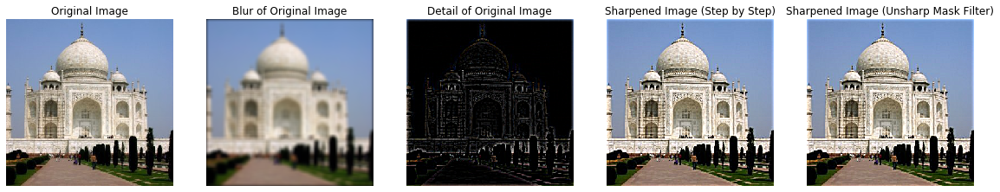

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


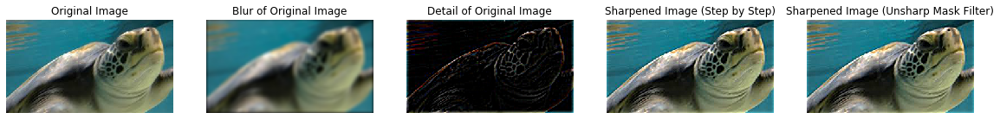

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


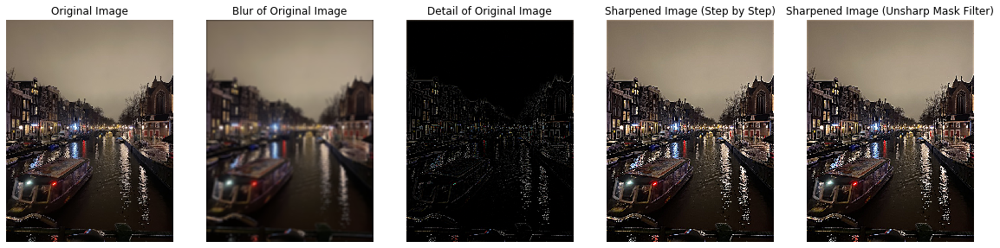

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


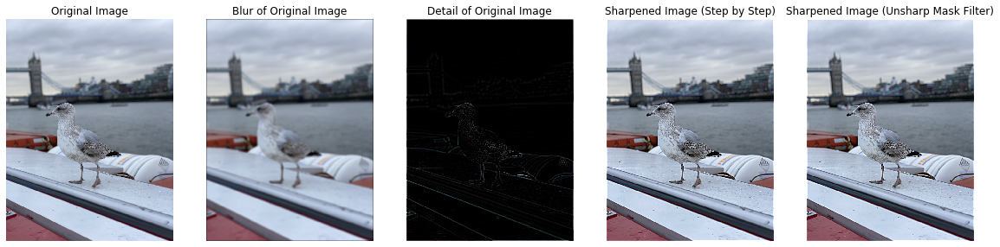

In [14]:
for i in range(len(results)):
    im, im_sh_step, im_blur, detail, im_sh_filt = results[i]
    plt.figure(figsize=(20,10))

    plt.subplot(151)
    plt.axis('off')
    plt.title("Original Image")
    plt.imshow(im)
    
    plt.subplot(152)
    plt.axis('off')
    plt.title("Blur of Original Image")
    plt.imshow(im_blur)
    
    plt.subplot(153)
    plt.axis('off')
    plt.title("Detail of Original Image")
    plt.imshow(detail/detail.max())

    plt.subplot(154)
    plt.axis('off')
    plt.title("Sharpened Image (Step by Step)")
    plt.imshow(im_sh_step)

    plt.subplot(155)
    plt.axis('off')
    plt.title("Sharpened Image (Unsharp Mask Filter)")
    plt.imshow(im_sh_filt)

    plt.show()
    
#     For saving
#     fname = fnames[i]
#     new_name = "out" + fname[fname.index("/"):fname.index(".")] + "_sharp.jpg"
#     plt.imsave(new_name, np.clip(im_sh_filt, 0, 1))

## Part 2.2 -  Hybrid Images

The goal of this part of the assignment is to create hybrid images using the approach described in the SIGGRAPH 2006 [paper](http://cvcl.mit.edu/publications/OlivaTorralb_Hybrid_Siggraph06.pdf) by Oliva, Torralba, and Schyns. Hybrid images are static images that change in interpretation as a function of the viewing distance. The basic idea is that high frequency tends to dominate perception when it is available, but, at a distance, only the low frequency (smooth) part of the signal can be seen. By blending the high frequency portion of one image with the low-frequency portion of another, you get a hybrid image that leads to different interpretations at different distances.

This question requires a bit of image preprocessing because, for this to work well, the images must be aligned. The alignment for this question was done in a separate python script (provided by course staff) that was modified to write the images to disk. These aligned images were then read in this notebook and used to create the hybrid image.

The actual hybrid image is created by taking the sum of the low pass filtered $\verb|im1|$ and the high pass filtered $\verb|im2|$. The low pass filter is a Gaussian filter, and the high pass filter is a Laplacian of Gaussian filter ($\delta-\text{Gaussian})$

The hybrid images were used to create a hybrid of a man and a cat, me and a landscape background, and Prof. Miki Lustig and Prof. Alexei Efros. For the man and cat hybrid, I had to modify the method and amplify the high frequency image to account for differences in lighting conditions. The hybrid of me and the landscape is the failure case, as the blending does not work too well.

I've also included Fourier domain analysis of the professor hybrid image below.

In [15]:
def hybrid_image(im1, im2, std1, std2):
    g1 = cv2.getGaussianKernel(5, std1)
    g2 = cv2.getGaussianKernel(5, std2)
    lpf = np.dstack([conv(im1[...,i], np.outer(g1,g1)) for i in range(3)])
    hpf = im2 - np.dstack([conv(im2[...,i], np.outer(g2,g2)) for i in range(3)])
    return (lpf+hpf), lpf, hpf

In [16]:
fnames = [("data/derek_aligned.jpg", "data/cat_aligned.jpg"),\
          ("data/hills.jpeg", "data/me.jpeg"),
          ("data/mlustig.jpg", "data/efros.jpg")]
sigmas = [(2, 5),(2, 5), (2,3)]
results = []
for i, fname in enumerate(fnames):
    im1 = plt.imread(fname[0]).astype(float)/255
    im2 = plt.imread(fname[1]).astype(float)/255
    if "derek" in fname[0]:
        _, lpf, hpf = hybrid_image(im1, im2, sigmas[i][0], sigmas[i][1])
        results.append((lpf+10*hpf, None, None))
    else:
        results.append(hybrid_image(im1, im2, sigmas[i][0], sigmas[i][1]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


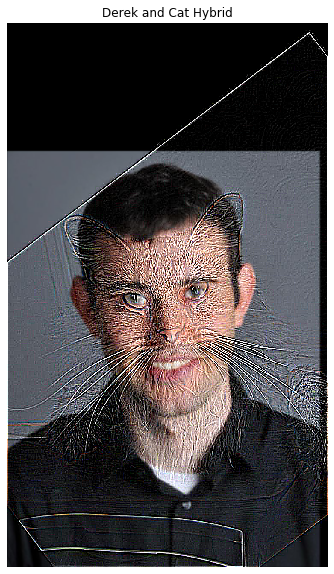

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


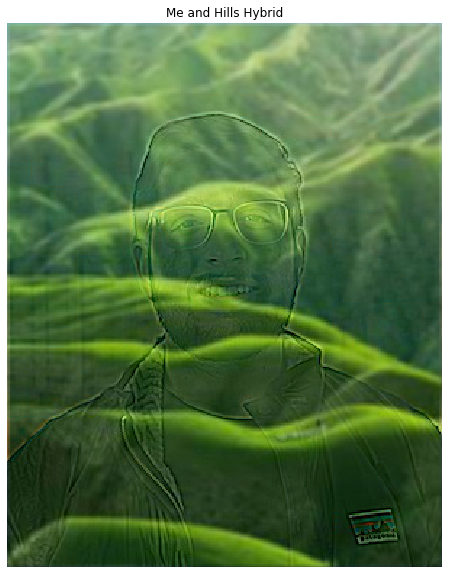

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


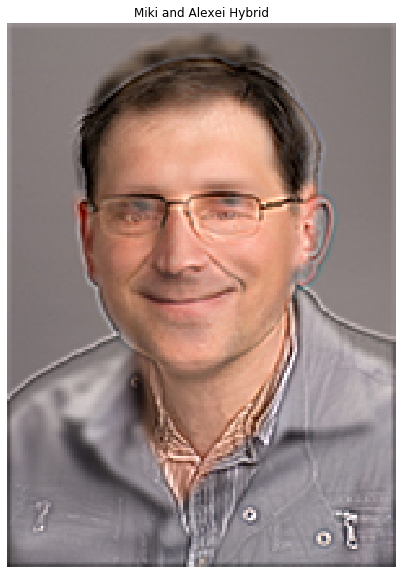

In [17]:
titles = ["Derek and Cat Hybrid", "Me and Hills Hybrid", "Miki and Alexei Hybrid"]
for i in range(len(fnames)):
    hybrid, lpf, hpf = results[i]
    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.title(titles[i])
    plt.imshow(hybrid)
    plt.show()
    
    # Saving
#     plt.imsave("out/"+titles[i]+".jpg", np.clip(hybrid,0,1))

Below we can see the frequency content for each original image, each filtered image, and the hybrid image. As we can see below, this hybrid image technique merges the low and high frequency content of $\verb|im1|$ and $\verb|im2|$ respectively.

In [18]:
def fft(im):
    if len(im.shape)==3:
        im = np.mean(im, axis=-1)
    return np.log(np.abs(np.fft.fftshift(np.fft.fft2(im))))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


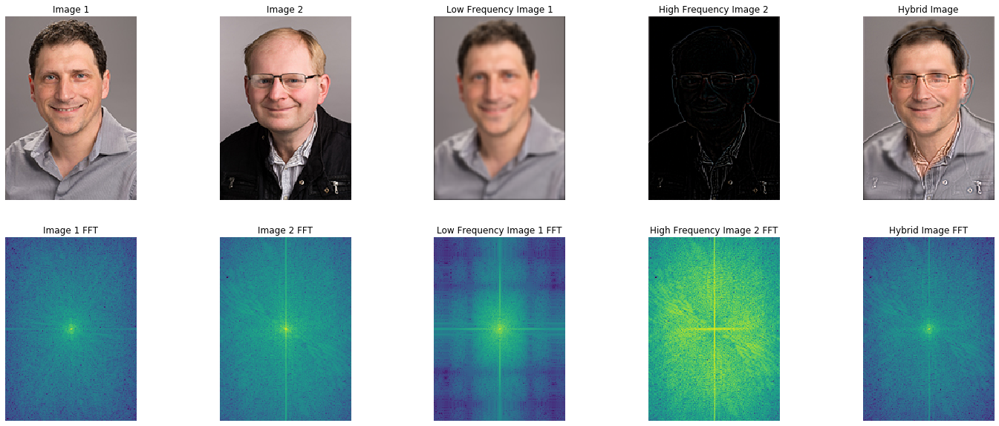

In [19]:
plt.figure(figsize=(25,10))
imgs = [im1, im2,lpf,hpf, hybrid]
ffts = [fft(im) for im in imgs]
titles = ["Image 1", "Image 2", "Low Frequency Image 1", "High Frequency Image 2", "Hybrid Image"]
titles = titles + ["Image 1 FFT", "Image 2 FFT", "Low Frequency Image 1 FFT", "High Frequency Image 2 FFT", "Hybrid Image FFT"]
res = imgs+ffts
for i in range(len(res)):
    plt.subplot(2, 5, i+1)
    plt.axis('off')
    plt.title(titles[i])
    plt.imshow(res[i])

# Saving figure
# plt.savefig("out/hybrid_fft_comp.png")

## Part 2.3 - Gaussian and Laplacian Stacks

In this question we create Gaussian and Laplacian stacks for images. The Gaussian stack is created by taking an image and each level blurring it more and more. Again, I used a Gaussian filter to blur. The filter started with $\text{size}=9$ and $\sigma=5$ and at every level I increased the size and $\sigma$ by $2$. The Laplacian stack is constructed by taking the difference of successive levels of the Gaussian stack, with the final image as the lowest level of the Gaussian stack.

The results of the Gaussian and Laplacian stacks are shown below. 

In [20]:
def gauss_stack_rec(im, niter=4, kern=9, std=2):
    if niter == 0:
        return []
    g1 = cv2.getGaussianKernel(kern, std)
    lpf = np.dstack([conv(im[...,i], np.outer(g1,g1)) for i in range(3)])
    return  [lpf] + gauss_stack_rec(lpf, niter=niter-1, std=std+2, kern=kern+2)

def gauss_stack(im, niter=5, std=2, kern=9):
    return np.stack([im]+gauss_stack_rec(im, niter=niter-1, std=std, kern=kern),axis=-1)

def laplacian_stack(im, niter=5, std=2):
    stack = gauss_stack(im, niter, std)
    res = np.zeros(stack.shape)
    for i in range(stack.shape[-1]-1):
        res[...,i] = stack[...,i]-stack[...,i+1]
    res[...,-1] = stack[...,-1]
    return res


In [21]:
fnames = ["data/lincoln.jpg", "data/mona.jpg", "out/Miki and Alexei Hybrid.jpg"]

In [22]:
gauss_stacks = []
lap_stacks = []
for fname in fnames:
    im = plt.imread(fname).astype(float)
    im = im/im.max()
    gauss_stacks.append(gauss_stack(im, std=4))
    lap_stacks.append(laplacian_stack(im, std=5))

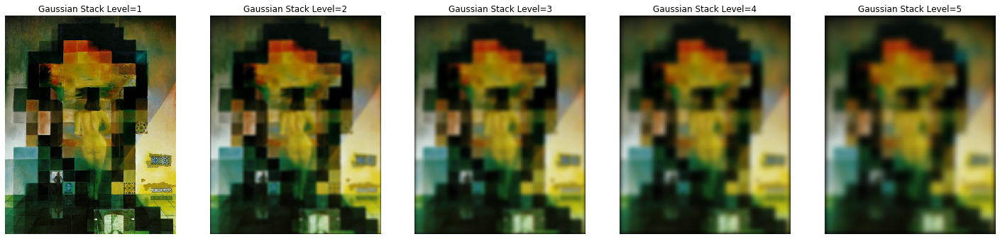

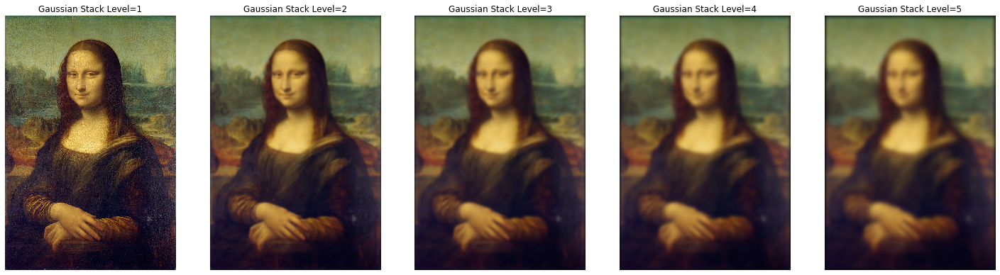

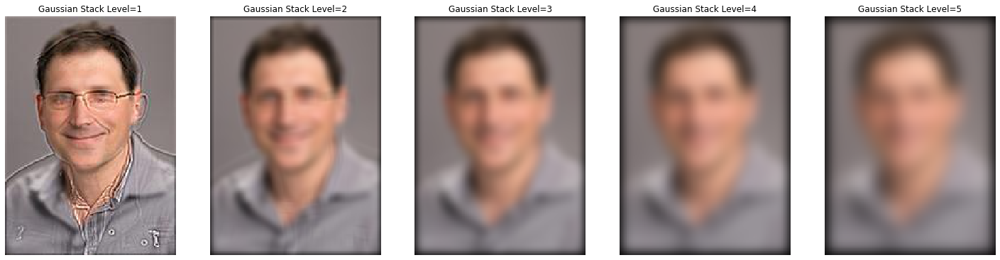

In [23]:
# Plotting
for idx in range(len(fnames)):
    plt.figure(figsize=(25,15))
    stack = gauss_stacks[idx]
    for i in range(stack.shape[-1]):
        plt.subplot(2, 5, i+1)
        plt.axis('off')
        plt.title("Gaussian Stack Level={}".format(i+1))
        plt.imshow(stack[...,i])
    
    # Saving
#     fname = fnames[idx]
#     new_name = "out" + fname[fname.index("/"):fname.index(".")] + "_gaussian_stack.png"
#     plt.savefig(new_name)

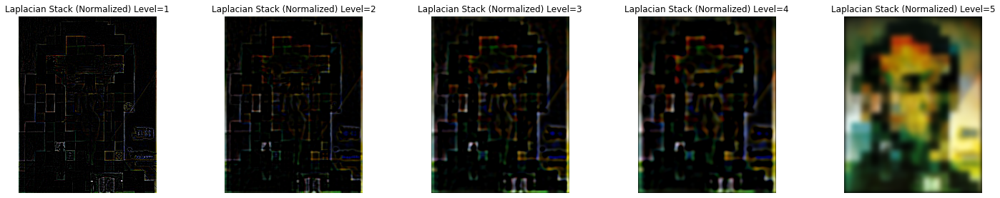

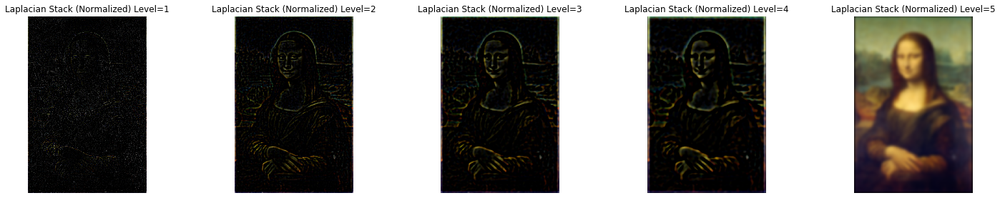

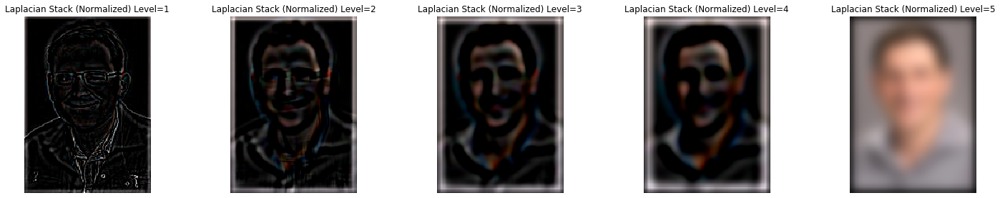

In [24]:
# Plotting
for idx in range(len(fnames)):
    plt.figure(figsize=(25,10))
    stack = lap_stacks[idx]
    for i in range(stack.shape[-1]):
        plt.subplot(2, 5, i+1)
        plt.axis('off')
        plt.title("Laplacian Stack (Normalized) Level={}".format(i+1))
        plt.imshow(np.clip(stack[...,i]/stack[...,i].max(), 0, 1))
#         plt.imshow(np.stack([stack[...,j,i]/stack[...,j,i].max() for j in range(3)],axis=-1))
    
#     # Saving
#     fname = fnames[idx]
#     new_name = "out" + fname[fname.index("/"):fname.index(".")] + "_laplacian_stack.png"
#     plt.savefig(new_name)

## Part 2.4 - Multiresolution Blending

The goal of this part of the assignment is to blend two images seamlessly using a multi resolution blending as described in the 1983 [paper](http://persci.mit.edu/pub_pdfs/spline83.pdf) by Burt and Adelson. An image spline is a smooth seam joining two image together by gently distorting them. Multiresolution blending computes a gentle seam between the two images seperately at each band of image frequencies, resulting in a much smoother seam.

This is done by using the Gaussian and Laplacian stacks created in the previous question. The procedure from the paper is as follows:

- Step la. Build Laplacian stacks LA and LB for images A and B respectively.
- Step lb. Build a Gaussian stack GR for the region image R. R is a mask with $1$ over the region to be splined and $0$ otherwise
- Step 2. Form a combined pyramid LS from LA and LB using nodes of GR as weights. That is, for each $l,i,j$:
    $LS_l[i, j] = GR_l[i, j]LA_l[i, j] + (1 - GR_l[i, j]))LB_l[i, j]$
- Step 3. Obtain the splined image S summing the levels of LS: $S=\sum_l LS_l$

In addition to a vertical edge mask, I created an image with an irregular image mask. The mask was created manually through Preview. The results of the splined image, along with the stacks described in the procedure above, are shown below.

In [25]:
# Padding function refactored from stack overflow
def pad(im, goal_shape, diver_im=False, diver=False):
    goal_y, goal_x, _ = goal_shape
    y, x ,_= im.shape
    y_pad = (goal_y-y)
    x_pad = (goal_x-x)
    return np.dstack(\
          [np.pad(im[...,i],((y_pad//2, y_pad//2 + y_pad%2), (x_pad//2 - (100 if diver else 0), x_pad//2 + (100 if diver else 0)+ x_pad%2)),\
           mode = 'constant', constant_values=np.mean(im[...,i]) if diver_im else 0) for i in range(3)])

In [26]:
fnames = [("data/apple.jpeg", "data/orange.jpeg"),\
          ("data/nyc_2.jpg", "data/nyc_1.jpg"),\
          ("data/diver.jpeg", "data/nebula.jpg")]
# fnames = [("data/nyc_2.jpg", "data/nyc_1.jpg")]

results = []
for fname in fnames:
    im_l = plt.imread(fname[0]).astype(float)/255
    im_r = plt.imread(fname[1]).astype(float)/255
    
    if "diver" in fname[0]:
        mask = 1-np.repeat(plt.imread("data/diver mask.png")[...,-1,None], 3,axis=-1)
        mask = pad(mask, im_r.shape, diver=True)      
        im_l = pad(im_l, im_r.shape, diver=True, diver_im=True)
    else:
        mask = np.zeros(im_l.shape)
        c = im_l.shape[1]
        mask[:,:c//2-10,:] = 1
    
    lap_stack_l = laplacian_stack(im_l)
    lap_stack_r = laplacian_stack(im_r)
    mask_stack = gauss_stack(mask, kern=15, std=7)
        
    blended_im = np.zeros(im_l.shape)
    for i in range(mask_stack.shape[-1]):
        blended_im = blended_im + mask_stack[...,i]*lap_stack_l[...,i]+(1-mask_stack[...,i])*lap_stack_r[...,i]
    
    results.append((lap_stack_l, lap_stack_r, mask_stack, blended_im))

In [27]:
%matplotlib inline

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

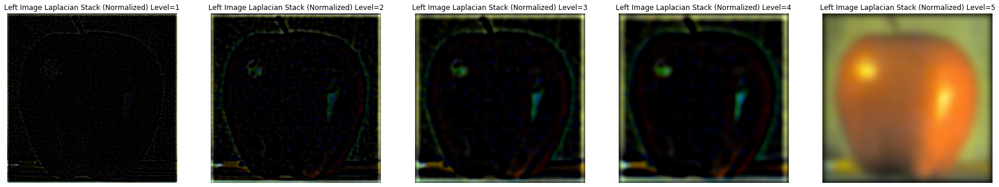

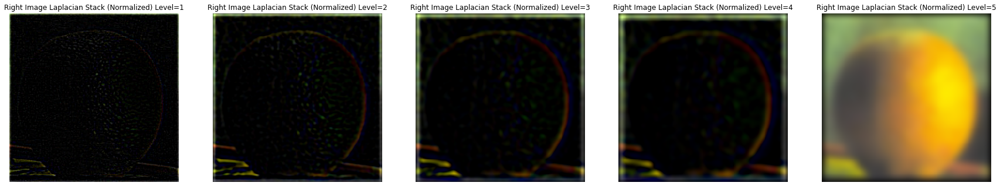

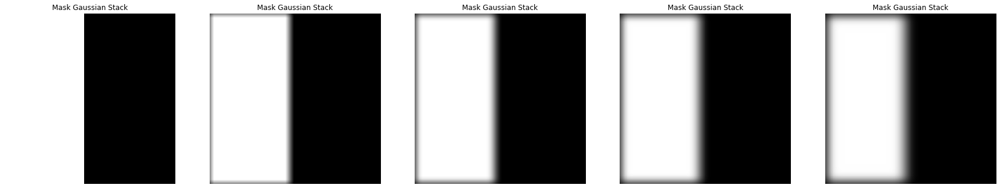

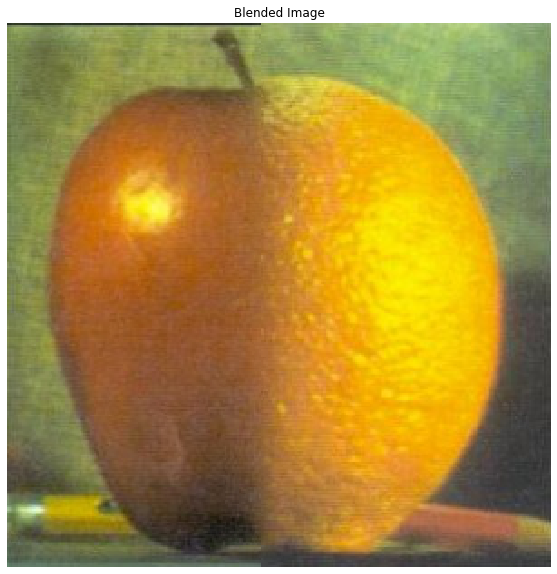

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

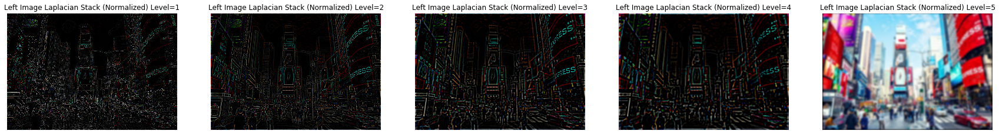

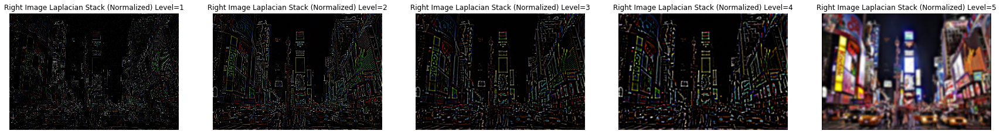

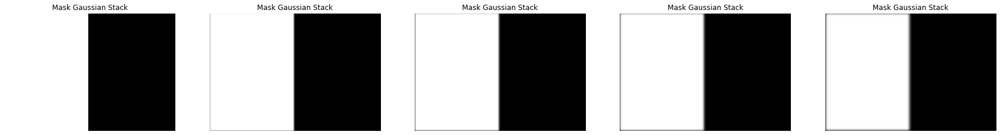

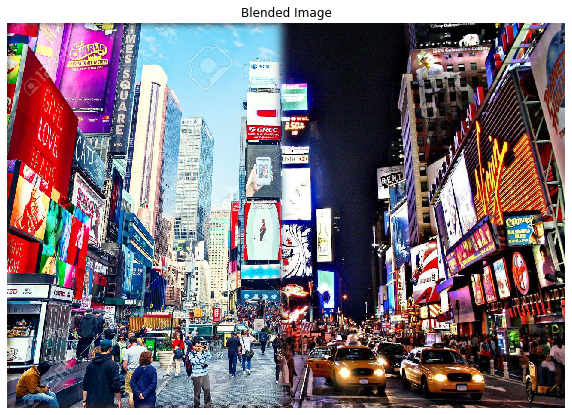

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

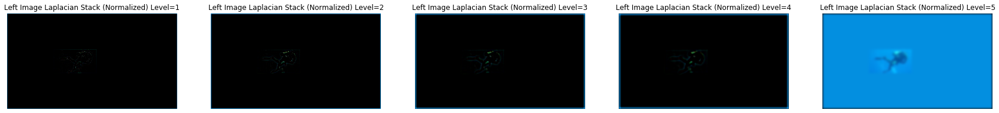

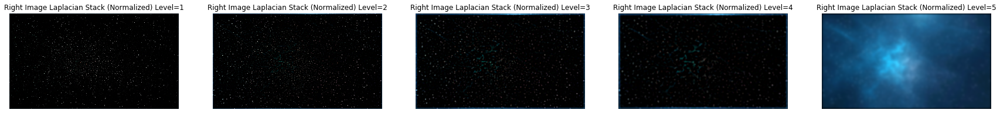

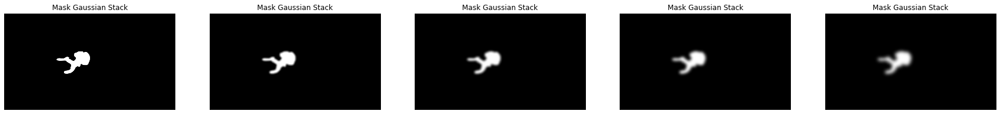

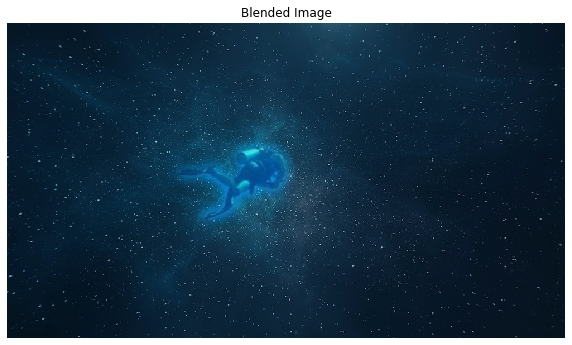

In [28]:
for idx in range(len(fnames)):
    ls_l, ls_r, mask_stack, blended_im = results[idx]
    
    plt.figure(figsize=(30,15))
    for i in range(mask_stack.shape[-1]):
        plt.subplot(2, 5, i+1)
        plt.axis('off')
        plt.title("Left Image Laplacian Stack (Normalized) Level={}".format(i+1))
        plt.imshow(ls_l[...,i]/ls_l[...,i].max())
        
    plt.figure(figsize=(30,15))
    for i in range(mask_stack.shape[-1]):
        plt.subplot(2, 5, i+1)
        plt.axis('off')
        plt.title("Right Image Laplacian Stack (Normalized) Level={}".format(i+1))
        plt.imshow(ls_r[...,i]/ls_r[...,i].max())
    
    plt.figure(figsize=(30,15))
    for i in range(mask_stack.shape[-1]):
        plt.subplot(2, 5, i+1)
        plt.axis('off')
        plt.title("Mask Gaussian Stack")
        plt.imshow(mask_stack[...,i])
    
    plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.title("Blended Image")
    plt.imshow(blended_im)
    
    plt.show()
    
    #Saving
#     fname_l, fname_r = fnames[idx]
#     new_name = "out" + fname_l[fname_l.index("/"):fname_l.index(".")] + "_" + fname_r[fname_r.index("/")+1:fname_r.index(".")] + "_blend.jpg"
#     plt.imsave(new_name, np.clip(blended_im, 0, 1))